TASK: Extract and plot the amplitudes of the Eigen images in every snapshot

In [7]:

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt       
from matplotlib import rcParams       # import to change plot parameters
from matplotlib import cm             # imports colormaps
from matplotlib.ticker import MultipleLocator, FormatStrFormatter 
# we will use the line above to make the big plot of the PCA components below

import numpy as np                    # imports library for arrays
from tqdm import tqdm

# Below I import my own library. On my laptop they are located in home+'/Dropbox/research/master_code'
# Change that line of code so that it matches the location of the files on your laptop
import sys
from os.path import expanduser
home = expanduser("~")

sys.path.append(home+'/HALL_RESEARCH_GROUP/core_code')
from my_func import * # my module with some helpful functions
from my_plot import * # my module with some plotting functions
from my_pca  import * # my module with some PCA functions

textwidth   = 7.1014
columnwidth = 3.39441
font        = 12

from addon_modules import open_hdf5

Importing the Data Cubes with Image Data

In [11]:
data_dir = home+'/dataCubes/'

image_cube = open_hdf5(data_dir+'data_cube_mwc758.h5')  #original unblurred images
blurred_cube = open_hdf5(data_dir+'filtered_data_cube_800.h5') #images blurred with r=800
blurred_cube1 = open_hdf5(data_dir+'filtered_data_cube_1088.7573072109703.h5') #images blurred with r=1088



In [12]:
eigen_values, eigen_vectors = diy_PCA(image_cube)

np.shape(eigen_values), np.shape(eigen_vectors)

((162,), (162, 600, 600))

<>:7: SyntaxWarning: invalid escape sequence '\%'
<>:7: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_21037/3123045691.py:7: SyntaxWarning: invalid escape sequence '\%'
  ax1.set_ylabel('Eigenvalue (\%)')


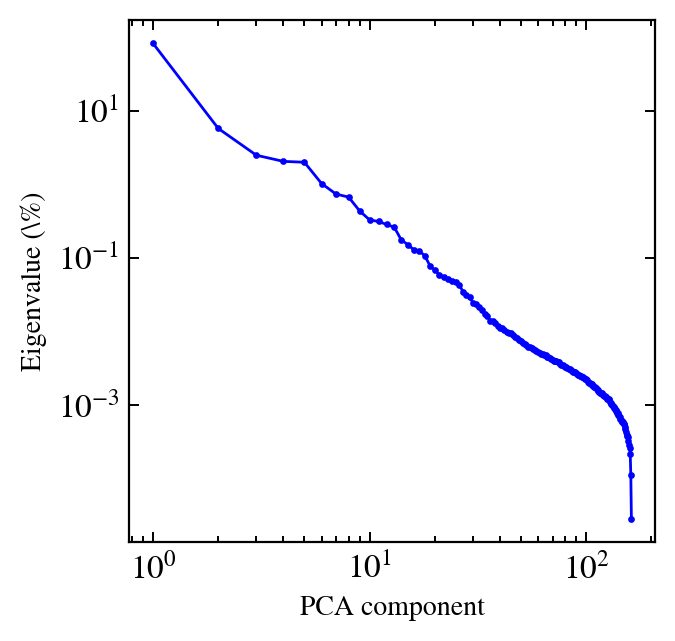

In [13]:
num=len(eigen_values) # number of eigenvalues you want to include in the plot, 1024 max
fig,(ax1) = plt.subplots(1,1)    
fig.set_size_inches(columnwidth,columnwidth)
ax1.scatter(np.arange(num)+1, eigen_values[:num]*100.,s=2, color='b')# multiply by 100 to make it a percent
ax1.loglog(np.arange(num)+1, eigen_values[:num]*100.,lw=1, color='b')# multiply by 100 to make it a percent
ax1.set_xlabel('PCA component')
ax1.set_ylabel('Eigenvalue (\%)')
ax1.tick_params(axis='both', which='both', labelsize=font,width=.7,direction='in', right=True, top=True,color='k') 

# fig.savefig('PCA_eigenvalues.pdf', bbox_inches='tight') # this line saves the figure to a file, uncomment if you'd like to do that


The Code block below actually calculates the amplitude of each eigenimage in every snapshot and returns a multi dimensional array

In [14]:
def get_amplitudes (x, num, images, pc):
     #x is the number of pixels
     #number is the number of pca components to be used
     #images are the images to be used
     #pc are the principal components

     storage = []

     for i in tqdm(range(images.shape[0]), desc="Calculating the amplitudes ..."):
          amps = get_amps(pc[:num,:,:], images[i,:,:])
          storage.append(amps)
     
     return storage


val = get_amplitudes(600, len(eigen_values), image_cube, eigen_vectors)

# a row in this array has elements which correspond to the amplitude of a particular pca component in a snapshot



Calculating the amplitudes ...:   0%|          | 0/162 [00:00<?, ?it/s]

Calculating the amplitudes ...: 100%|██████████| 162/162 [03:18<00:00,  1.23s/it]


In [15]:
np.shape(val)

(162, 162)

Plot below shows variation of intensity of each amplitude of ev in a particular snapshot

In [2]:

import matplotlib.pyplot as plt
import numpy as np

'''

# Create time array for columns (X-axis for each subplot)
index = range(len(val[0]))

# Number of rows
num_rows = len(val)

# Determine the number of subplots needed
columns_per_row = 5
num_subplot_rows = (num_rows + columns_per_row - 1) // columns_per_row  # Ceiling division

# Create subplots
fig, axs = plt.subplots(num_subplot_rows, columns_per_row, figsize=(20, num_subplot_rows * 4), sharex=True, sharey=True)

# Flatten the 2D array of axes to make it easier to iterate
axs = axs.flatten()

# Plot each row in its own subplot

for row_index in range(num_rows):
    values = val[row_index]
    axs[row_index].plot(index, values, marker='o', linestyle='-', label=f'Time step {row_index}')
    axs[row_index].set_title(f'Time step {row_index}')
    axs[row_index].set_xlabel('Index')
    axs[row_index].set_ylabel('Value')
    axs[row_index].grid(True)
    axs[row_index].legend()

# Hide any unused subplots
for i in range(num_rows, len(axs)):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
#plt.show()

'''

NameError: name 'val' is not defined

Changes in Values for a particular principal component

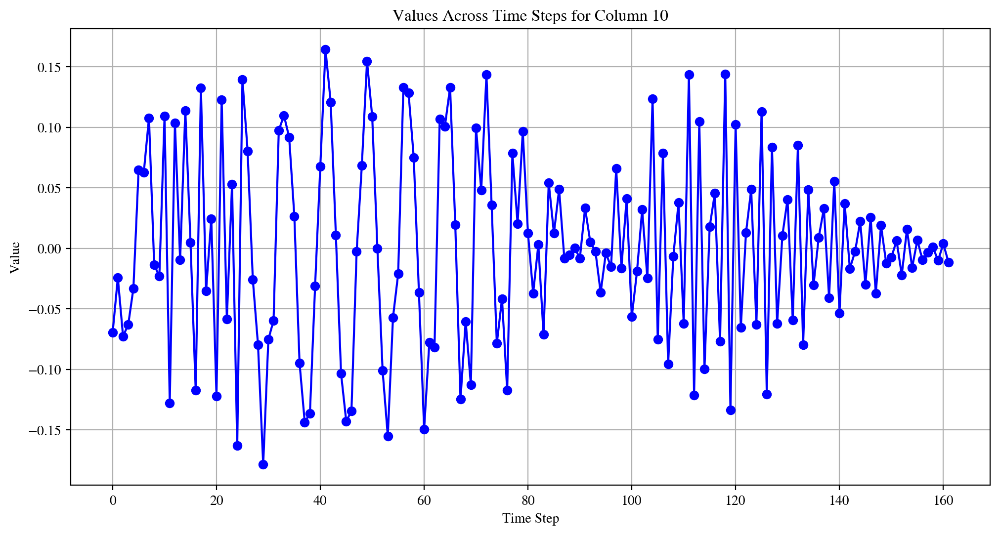

In [16]:
# Choose the column you want to visualize (e.g., column 5)
column_index = 10 #this is actually the visualization of pca number 10



# Create time array for rows

values = [row[column_index] for row in val] # extract all values accros column 10. Thus show the values of the amplitudes for different snapshots
# Plot the values of the chosen column across rows

time_steps = range(len(values))
plt.figure(figsize=(12, 6))
plt.plot(time_steps, values, marker='o', linestyle='-', color='b')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.title(f'Values Across Time Steps for Column {column_index}')
plt.grid(True)
plt.show()

In [17]:
import matplotlib.pyplot as plt

# Determine the number of subplots needed
# Here, we use a grid with 5 columns and as many rows as needed
columns_per_row = 5
num_columns =162
num_rows = (num_columns + columns_per_row - 1) // columns_per_row  # Ceiling division

# Create the subplots
fig, axs = plt.subplots(num_rows, columns_per_row, figsize=(20, num_rows * 4), sharex=True, sharey=True)

# Flatten the 2D array of axes to make it easier to iterate
axs = axs.flatten()
time_steps = range(len(val))

# Number of columns
num_columns = len(val[0])
# Plot each column in its own subplot
for column_index in range(num_columns):
    values = [row[column_index] for row in val]
    axs[column_index].plot(time_steps, values, marker='o', linestyle='-', label=f'Column {column_index}')
    axs[column_index].set_title(f'Eigen vector {column_index+1} variation across Images')
    axs[column_index].set_xlabel('Time Step')
    axs[column_index].set_ylabel('Value')
    axs[column_index].grid(True)
    axs[column_index].legend()

# Hide any unused subplots
for i in range(num_columns, len(axs)):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

I shall now visually inspect the planets position

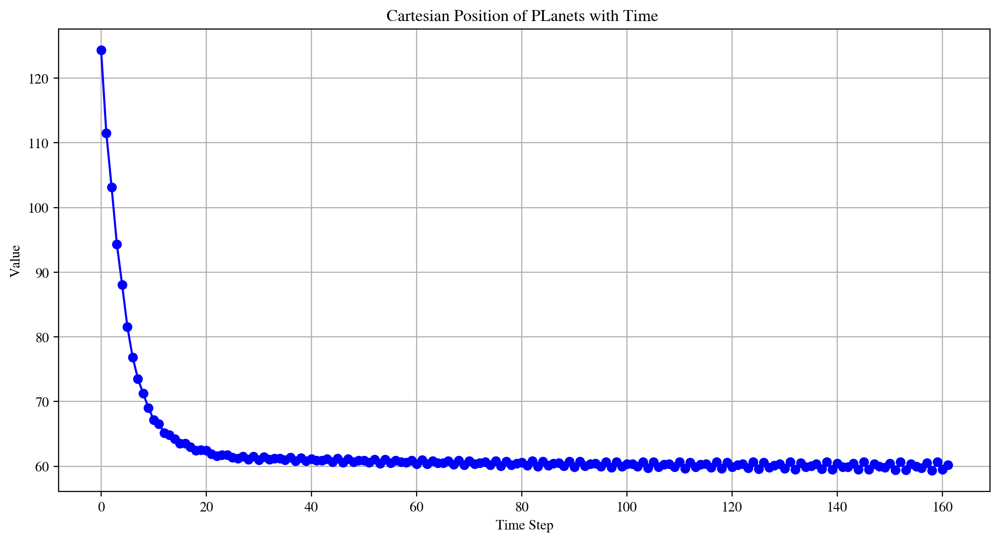

In [20]:
import pandas as pd

df = pd.read_csv('planet_positions.csv')

positions = df.iloc[0]


time_steps = range(len(positions))
plt.figure(figsize=(12, 6))
plt.plot(time_steps, positions, marker='o', linestyle='-', color='b')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.title(f'Cartesian Position of PLanets with Time ')
plt.grid(True)
plt.show()

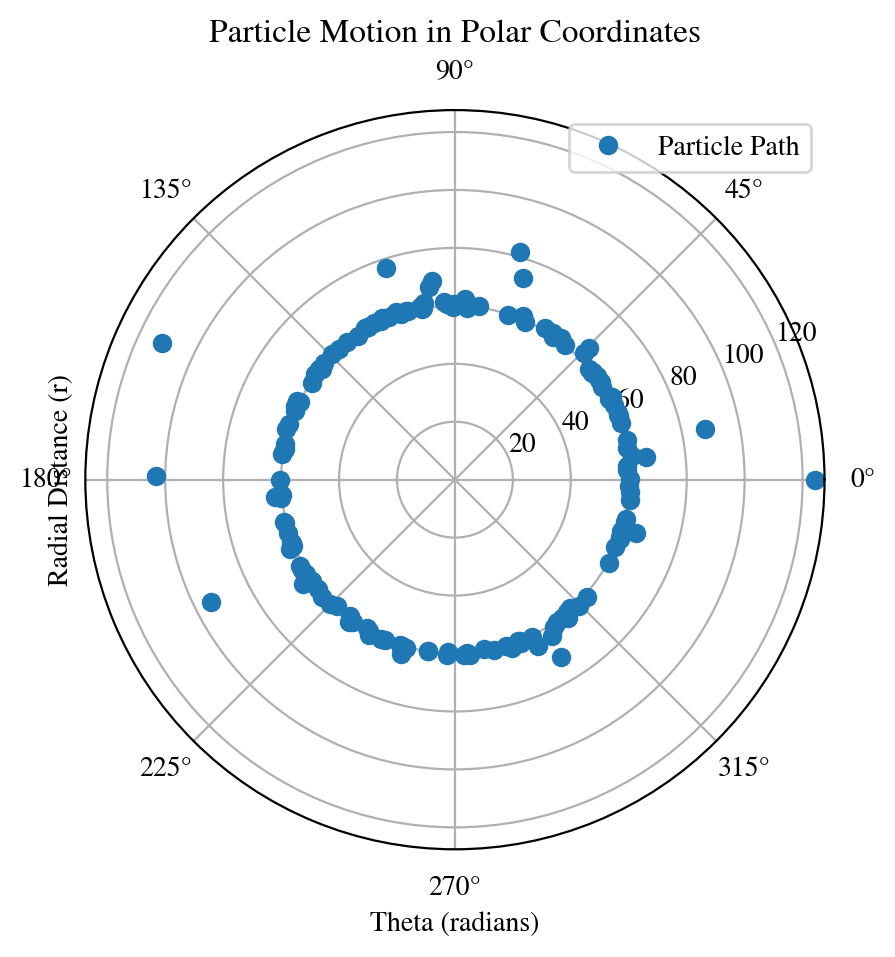

In [32]:
import pandas as pd

df = pd.read_csv('mwc_angular_position.csv')

positions1 = df.iloc[0]
# Convert angles from degrees to radians
theta_radians = np.deg2rad(positions1)



fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

# Plot the radial and angular components
ax.plot(positions1, positions, 'o', label='Particle Path')  # 'o-' means circular markers with a line

# Optional: Add labels and title
ax.set_title('Particle Motion in Polar Coordinates')
ax.set_xlabel('Theta (radians)')
ax.set_ylabel('Radial Distance (r)')

# Show the plot
plt.legend()
plt.show()

Building a Multiple Linear Regression Model to try to fit the Amplitudes of the Eigenimages to the radial and angular position of the planet 

In [43]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

#model.fit(val, positions) #fitting radial positions
model.fit(val, positions1) #fitting angular  positions

coefficients = model.coef_
r_squared = model.score(val, positions)

In [44]:
print(coefficients.shape)
print(r_squared)

(162,)
-92.77002383607186


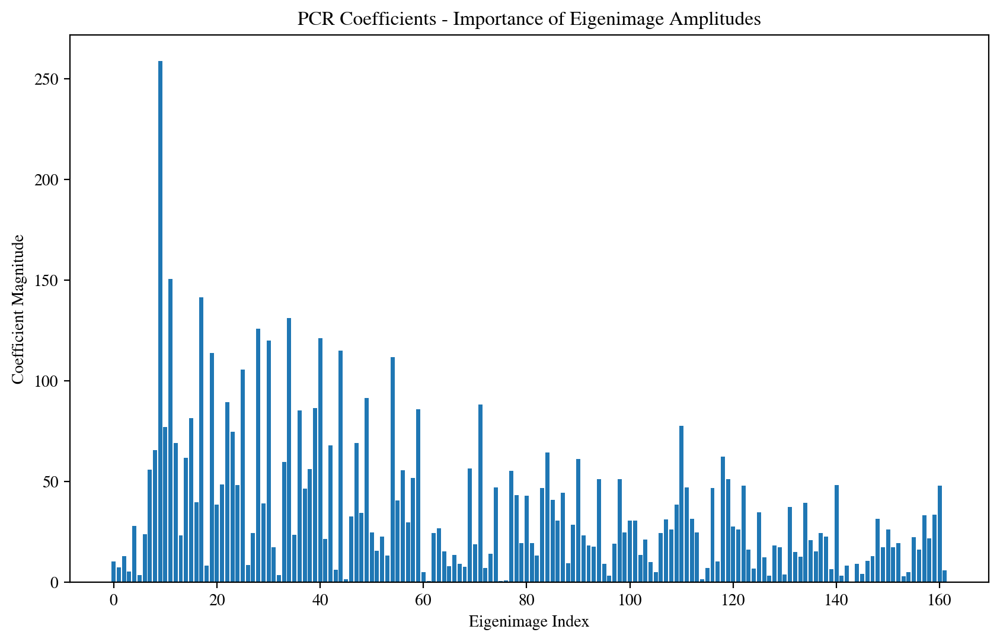

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(range(len(coefficients)), np.abs(coefficients))
plt.xlabel('Eigenimage Index')
plt.ylabel('Coefficient Magnitude')
plt.title('PCR Coefficients - Importance of Eigenimage Amplitudes')
plt.show()

In [42]:
import numpy as np

# Get the index of the largest coefficients
most_influential_indices = np.argsort(np.abs(coefficients))[-10:]  # Top 10
most_influential_amplitudes = coefficients[most_influential_indices]


print(most_influential_indices)
print(most_influential_amplitudes)

[ 7  9 14 10 18 13  8  0  5  1]
[  5.93349397   7.43849999   8.21424098  -8.97833874  21.57537107
 -22.68452243 -37.08987207  40.19491745  46.38809983  66.65180663]


In [54]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, spearmanr

# Example Data (Replace these with your actual data)
X = val # Replace with your actual 162x162 matrix
Y = positions1      # Replace with your actual 162x1 vector


In [55]:
# Convert to DataFrame for easier manipulation (optional)
df_X = pd.DataFrame(X)
df_Y = pd.Series(Y)


In [56]:
# Store Pearson correlations
pearson_correlations = []

for i in range(df_X.shape[1]):  # Loop over each column in X
    corr, _ = pearsonr(df_X.iloc[:, i], df_Y)
    pearson_correlations.append(corr)

# Convert to a DataFrame for easier analysis
pearson_corr_df = pd.DataFrame({'Feature': range(1, 163), 'Pearson Correlation': pearson_correlations})


In [60]:
# Store Spearman correlations
spearman_correlations = []

for i in range(df_X.shape[1]):
    corr, _ = spearmanr(df_X.iloc[:, i], df_Y)
    spearman_correlations.append(corr)

# Convert to a DataFrame for easier analysis
spearman_corr_df = pd.DataFrame({'Feature': range(1, 163), 'Spearman Correlation': spearman_correlations})


In [61]:
# Display the top features with the highest Pearson correlation
top_pearson = pearson_corr_df.sort_values(by='Pearson Correlation', ascending=False).head()

# Display the top features with the highest Spearman correlation
top_spearman = spearman_corr_df.sort_values(by='Spearman Correlation', ascending=False).head()

print("Top Pearson Correlations:\n", top_pearson)
print("Top Spearman Correlations:\n", top_spearman)


Top Pearson Correlations:
     Feature  Pearson Correlation
9        10             0.409444
17       18             0.216404
40       41             0.193972
54       55             0.186527
28       29             0.173382
Top Spearman Correlations:
     Feature  Spearman Correlation
9        10              0.414300
17       18              0.205333
40       41              0.196128
28       29              0.174471
54       55              0.168800


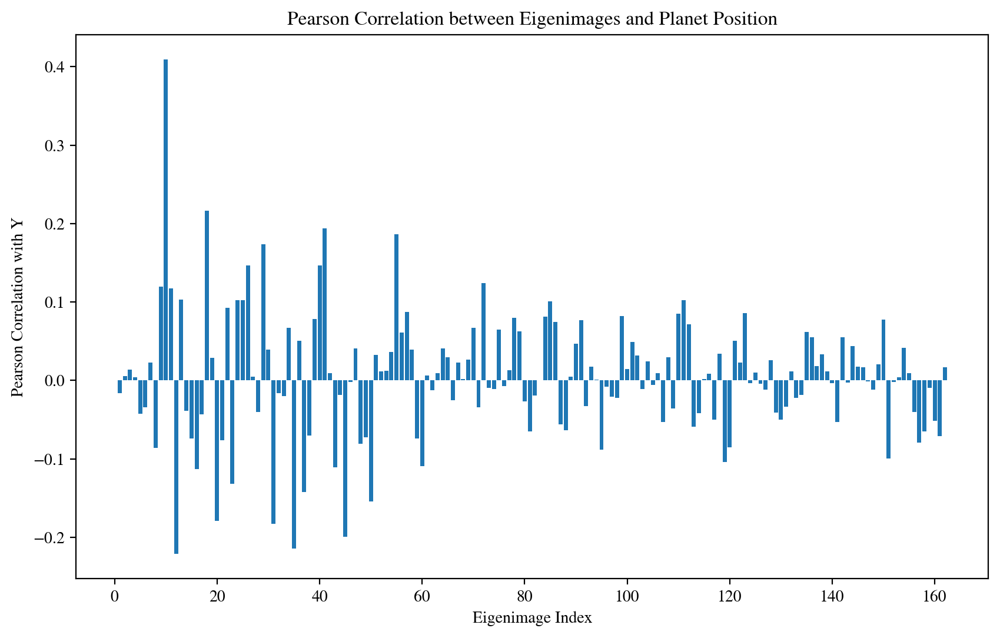

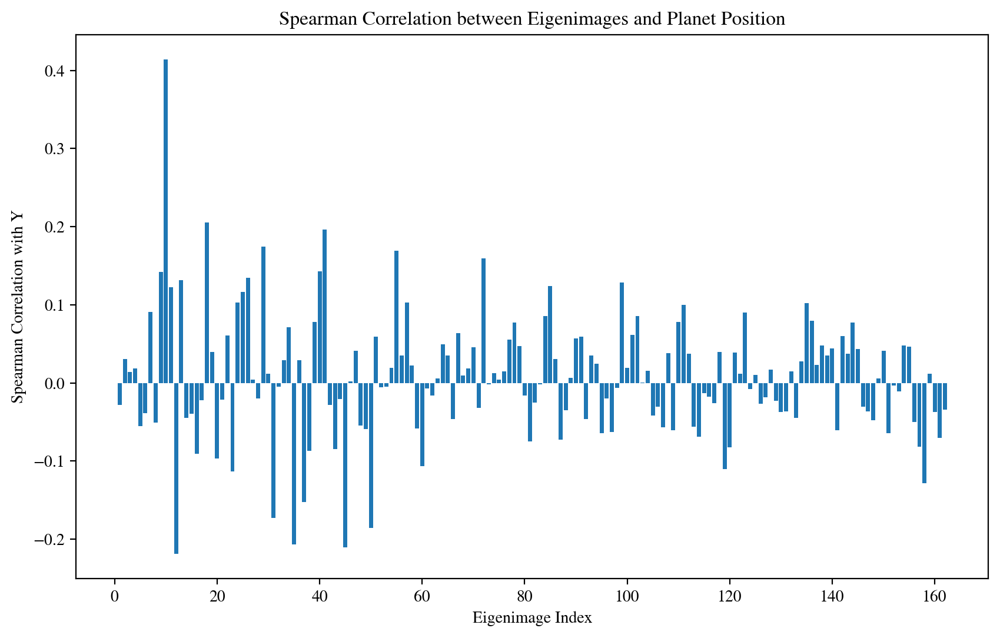

In [62]:
import matplotlib.pyplot as plt

# Plot Pearson Correlations
plt.figure(figsize=(10, 6))
plt.bar(pearson_corr_df['Feature'], pearson_corr_df['Pearson Correlation'])
plt.xlabel('Eigenimage Index')
plt.ylabel('Pearson Correlation with Y')
plt.title('Pearson Correlation between Eigenimages and Planet Position')
plt.show()

# Plot Spearman Correlations
plt.figure(figsize=(10, 6))
plt.bar(spearman_corr_df['Feature'], spearman_corr_df['Spearman Correlation'])
plt.xlabel('Eigenimage Index')
plt.ylabel('Spearman Correlation with Y')
plt.title('Spearman Correlation between Eigenimages and Planet Position')
plt.show()
